# ***Predictive Modeling of Critical Temperatures for Superconductors***

***Name :*** Lis Mary Antony 

***Organization :*** Entri Elevate

***Date :*** (Evaluation Date)

## 1. **Overview of Problem Statement:**

   The critical temperature *(Tc)* of superconductors determines their ability to exhibit superconducting properties, which are vital for applications in energy transmission, magnetic levitation, and quantum computing. Accurately predicting *Tc* is a challenging task due to the intricate relationships between material properties such as atomic mass, thermal conductivity, and electron affinity. Developing a robust predictive model can accelerate the discovery and design of high- *Tc* materials, revolutionizing advancements in material science and technology.

## 2. **Objective:**

   To develop the best predictive model for accurately estimating the critical temperature (*Tc*) of superconductors using machine learning techniques, enabling advancements in material design for energy-efficient and cutting-edge technological applications.

## 3. **Data Description:**

***Source of Data :*** UCI repository,  https://archive.ics.uci.edu/dataset/464/superconductivty+data

***Shape :*** Rows: 21263 x Columns: 82


***Features :*** 


**Atomic Mass Features:**
mean_atomic_mass, wtd_mean_atomic_mass (weighted mean), gmean_atomic_mass (geometric mean), entropy_atomic_mass, etc.

**Ionization Energy Features:**
mean_fie (first ionization energy), wtd_mean_fie, entropy_fie, etc.

**Atomic Radius Features:**
mean_atomic_radius, wtd_mean_atomic_radius, entropy_atomic_radius, etc.

**Density Features:**
mean_Density, wtd_mean_Density, entropy_Density, etc.

**Electron Affinity Features:**
mean_ElectronAffinity, wtd_mean_ElectronAffinity, entropy_ElectronAffinity, etc.

**Fusion Heat Features:**
mean_FusionHeat, wtd_mean_FusionHeat, entropy_FusionHeat, etc.

**Thermal Conductivity Features:**
mean_ThermalConductivity, wtd_mean_ThermalConductivity, entropy_ThermalConductivity, etc.

**Valence Features:**
mean_Valence, wtd_mean_Valence, entropy_Valence, etc.

**Range, Standard Deviation, and Weighted Variants:**
For each category above, the dataset includes features like range, std, and weighted variants.

***Target Variable:***
critical_temp (Critical Temperature in Kelvin) — the temperature below which the material exhibits superconductivity.

***Total Features: 81 features + 1 target column.***

## 4. **Data Collection**

Importing the python libraries

In [1]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt 
import seaborn as sns 

%matplotlib inline

import warnings 
warnings.filterwarnings('ignore') 

from sklearn.preprocessing import PowerTransformer 
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV 
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.feature_selection import SelectKBest, f_regression, RFE 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR 
from scipy.stats import uniform 
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

import joblib

In [3]:
# Loading the dataset

data = pd.read_csv("SC_T.csv")

In [5]:
# Converting to dataframe

df= pd.DataFrame(data)

In [7]:
# Getting the summary of dataframe

print("\nSummary of DataFrame:\n")
df.info()


Summary of DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19137 entries, 0 to 19136
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               19137 non-null  int64  
 1   mean_atomic_mass                 19137 non-null  float64
 2   wtd_mean_atomic_mass             19137 non-null  float64
 3   gmean_atomic_mass                19137 non-null  float64
 4   wtd_gmean_atomic_mass            19137 non-null  float64
 5   entropy_atomic_mass              19137 non-null  float64
 6   wtd_entropy_atomic_mass          19137 non-null  float64
 7   range_atomic_mass                19137 non-null  float64
 8   wtd_range_atomic_mass            19137 non-null  float64
 9   std_atomic_mass                  19137 non-null  float64
 10  wtd_std_atomic_mass              19137 non-null  float64
 11  mean_fie                         19137 non-null  float64

In [9]:
# First 5 rows of dataframe

df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [11]:
# Last 5 rows of dataframe

df.tail()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
19132,3,89.389833,89.389833,63.694713,63.694713,0.782574,0.782574,164.13150,54.710500,73.156893,...,4.666667,4.578857,4.578857,1.078992,1.078992,2,0.666667,0.942809,0.942809,3.43
19133,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
19134,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
19135,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84
19136,3,87.468333,86.858500,82.555758,80.458722,1.041270,0.895229,71.75500,43.144000,29.905282,...,4.500000,4.762203,4.242641,1.054920,0.970116,3,1.800000,1.414214,1.500000,12.80


In [13]:
# dimensions of DataFrame

df.shape

(19137, 82)

In [15]:
# getting descriptive statistics of numerical

df.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,...,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000
mean,4.116058,87.533428,73.038548,71.256715,58.582743,1.165615,1.063651,115.616730,33.317558,44.403645,...,3.153493,3.056684,3.056046,1.295873,1.053474,2.043371,1.483921,0.840555,0.675124,34.464237
std,1.440124,29.664764,33.461557,31.034992,36.629872,0.365057,0.401729,54.594463,26.994652,20.021118,...,1.191274,1.045009,1.174596,0.392852,0.380461,1.242200,0.980182,0.484899,0.455521,34.296283
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.451240,52.191114,57.984656,35.271922,0.968638,0.774032,78.334500,16.841153,32.890369,...,2.117555,2.279705,2.091517,1.060857,0.775026,1.000000,0.920586,0.451754,0.308515,5.350000
50%,4.000000,84.841880,60.835686,66.361592,39.930058,1.199541,1.146220,122.906070,26.707063,45.123500,...,2.618182,2.615321,2.433589,1.368922,1.165262,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.351275,86.145060,78.114179,73.215931,1.444537,1.360442,154.119320,38.453490,59.549699,...,4.030000,3.741657,3.923020,1.589027,1.331266,3.000000,1.920000,1.200000,1.020735,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [17]:
# Renaming columns

df = df.rename(columns={'critical_temp': 'Critical_Temperature'})

In [19]:
# column labels

df.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_

## 5. **Data Preprocessing - Data Cleaning:**

In [21]:
#  check for missing values

df.isnull().sum()

number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_Valence            0
wtd_range_Valence        0
std_Valence              0
wtd_std_Valence          0
Critical_Temperature     0
Length: 82, dtype: int64

In [23]:
# check for duplicate rows

df.duplicated().sum()

49

In [25]:
# remove duplicate rows

df1 = df.drop_duplicates()
df1.shape

(19088, 82)

In [27]:
# check for any remaining duplicate rows

df1.duplicated().sum()

0

In [29]:
# select the numeric columns

numeric_columns = df1.select_dtypes(include = ['number']).columns

In [31]:
# Print total numerical features and their names

print("Total Numerical Features:",numeric_columns.shape)
print("Numeric Features:",numeric_columns)

Total Numerical Features: (82,)
Numeric Features: Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffi

In [33]:
# total number of categorical features and the names

categorical_columns = df1.select_dtypes(include='object').columns
print("Total Categorical Features:",categorical_columns.shape)
print("Categorical Features:",categorical_columns)

Total Categorical Features: (0,)
Categorical Features: Index([], dtype='object')


In [35]:
# columns with numeric data type 

num_columns = df1.select_dtypes(include = ['number'])

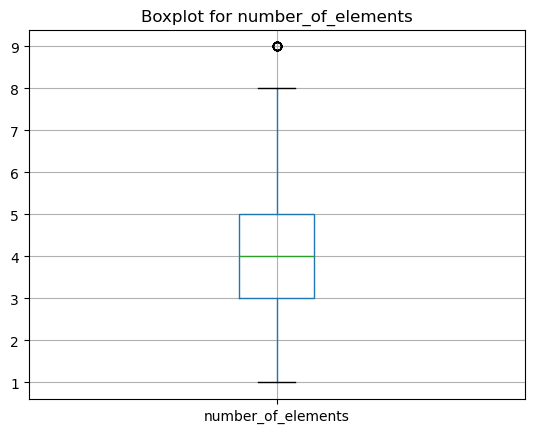

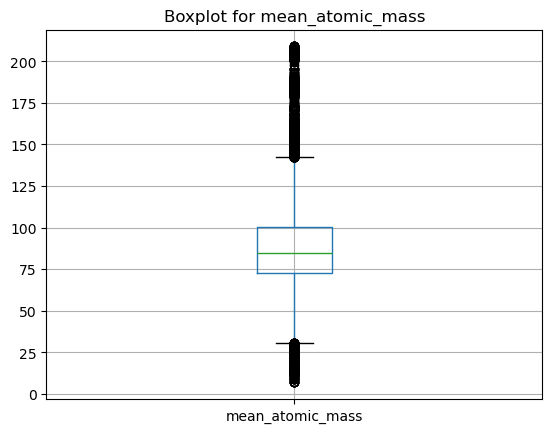

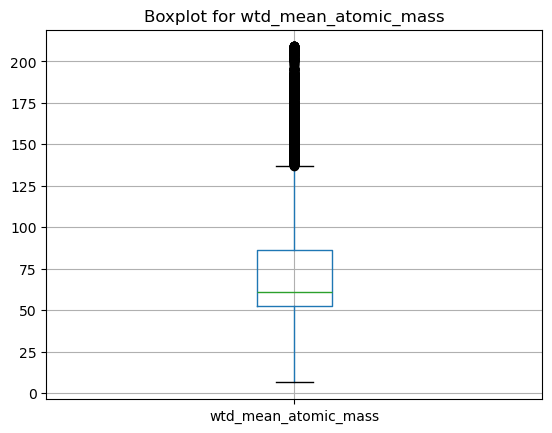

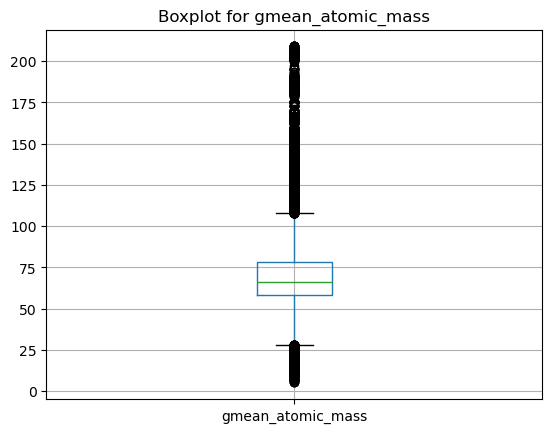

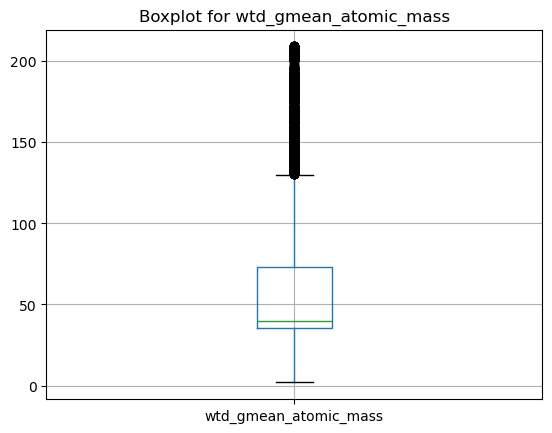

...

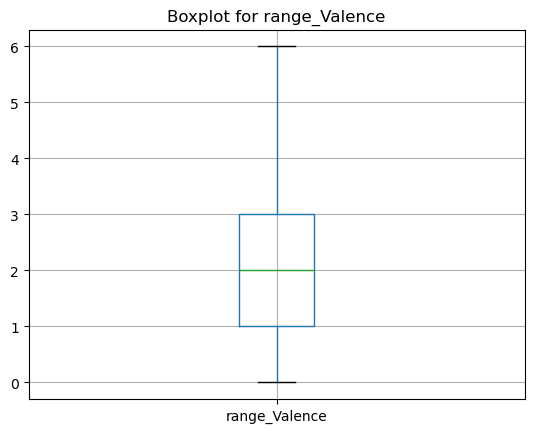

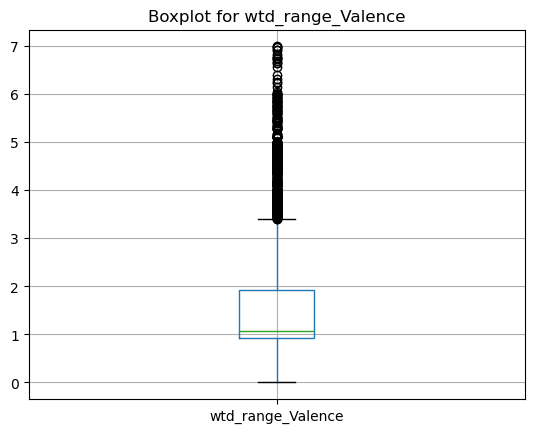

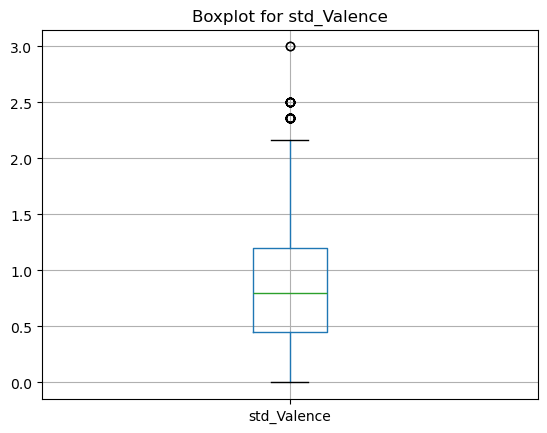

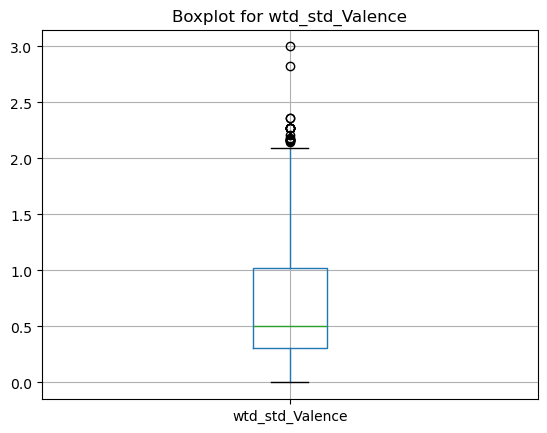

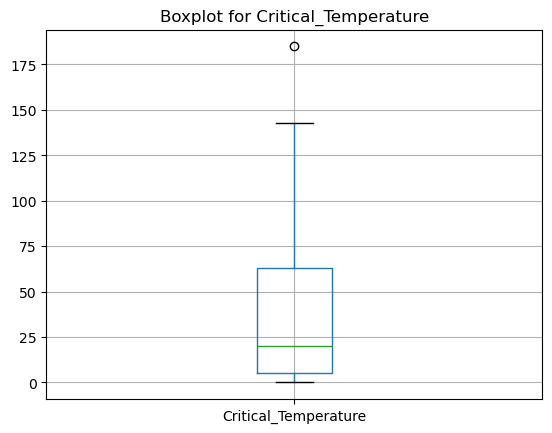

In [37]:
# separate boxplots for each numeric column 

for column in num_columns.columns:
    plt.figure()
    num_columns.boxplot(column = column)
    plt.title(f"Boxplot for {column}")

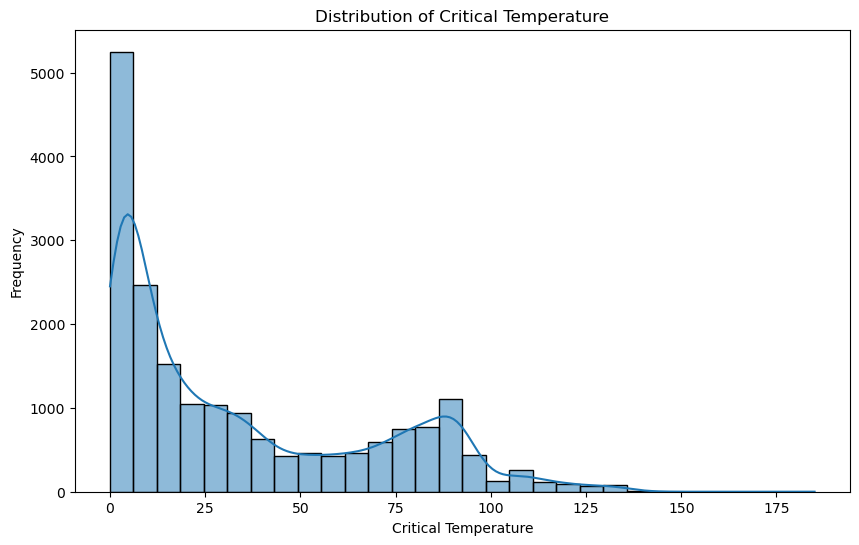

In [38]:
# generates a histogram for the Critical_Temperature column

plt.figure(figsize=(10,6))
sns.histplot(df1['Critical_Temperature'], bins=30, kde=True)
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label for y-axis
plt.show()

***Outliner Handling***

In [41]:
# Calculate Q1, Q3, and IQR
Q1 = df1[numeric_columns].quantile(0.25)
Q3 = df1[numeric_columns].quantile(0.75)
IQR = Q3 - Q1

In [43]:
# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [45]:
outliers = ((df1[numeric_columns] < lower_bound) | (df1[numeric_columns] > upper_bound))
print("Number of outliers in each column:")
print(outliers.sum())

Number of outliers in each column:
number_of_elements         14
mean_atomic_mass         1436
wtd_mean_atomic_mass     1111
gmean_atomic_mass        3001
wtd_gmean_atomic_mass    1114
                         ... 
range_Valence               0
wtd_range_Valence        1262
std_Valence                41
wtd_std_Valence            21
Critical_Temperature        1
Length: 82, dtype: int64


In [47]:
# Define function for handling outliner using IQR

def handle_outliners_iqr(df):
    for col in df1.select_dtypes(include=['int64', 'float64']).columns:
        Q1 = df1[col].quantile(0.25)
        Q3 = df1[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define lower and upper bounds
        lower = Q1 - (1.5*IQR)
        upper = Q3 + (1.5*IQR)
        
        # Cap the outliners using capping (Winsorizing)
        df1[col] = df1[col].apply(lambda x: lower if x < lower else upper if x > upper else x)

    return df

df2 = handle_outliners_iqr(df1)

In [49]:
print("Shape after capping outliers:", df2[numeric_columns].shape)

Shape after capping outliers: (19088, 82)


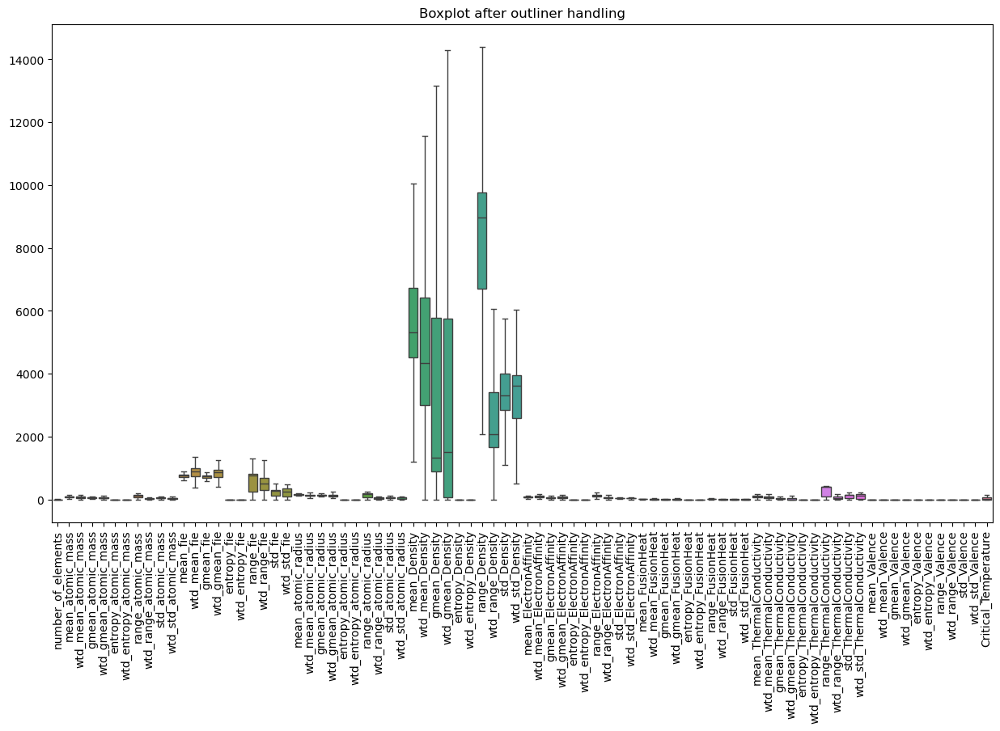

In [51]:
# generating a boxplot for the DataFrame df2 after handling outliers

plt.figure(figsize=(15,8))
sns.boxplot(data=df2)
plt.title('Boxplot after outliner handling')
plt.xticks(rotation = 90)
plt.show()

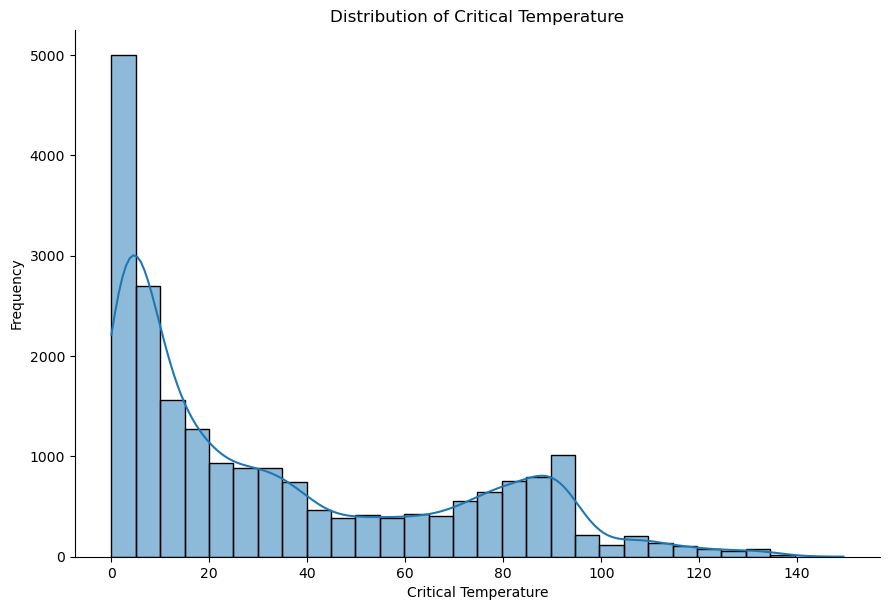

In [54]:
#  generating a distribution plot before transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution plot
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label fot the y-axis
plt.show()

***Skewness Addressing***

In [52]:
# Check skewness of numerical columns

numerical_features = df2.select_dtypes(include=['float64', 'int64']).columns


In [55]:
skewness = df2[numerical_features].skew()

# Categorize skewness
fairly_skewness = skewness[(skewness >= -0.5) & (skewness <= 0.5)]
moderate_skewness = skewness[(skewness > 0.5) & (skewness <= 1) | (skewness < -0.5) & (skewness >= -1)]
high_skewness = skewness[(skewness > 1) | (skewness < -1)]

In [57]:
# Displaying results
print("Skewness of Numeric Columns:\n", skewness)
print("\nFairly Skewness:\n", fairly_skewness)
print("\nModerate Skewness:\n", moderate_skewness)
print("\nHigh Skewness:\n", high_skewness)

Skewness of Numeric Columns:
 number_of_elements      -0.002091
mean_atomic_mass         0.242885
wtd_mean_atomic_mass     0.776434
gmean_atomic_mass        0.271968
wtd_gmean_atomic_mass    1.072192
                           ...   
range_Valence            0.467760
wtd_range_Valence        1.066115
std_Valence              0.432837
wtd_std_Valence          0.641721
Critical_Temperature     0.855172
Length: 82, dtype: float64

Fairly Skewness:
 number_of_elements                -0.002091
mean_atomic_mass                   0.242885
gmean_atomic_mass                  0.271968
range_atomic_mass                 -0.376163
std_atomic_mass                   -0.347157
wtd_std_atomic_mass               -0.315268
mean_fie                           0.143999
wtd_mean_fie                      -0.288635
gmean_fie                          0.428406
wtd_gmean_fie                     -0.315962
wtd_entropy_fie                    0.114103
range_fie                         -0.457029
wtd_range_fie         

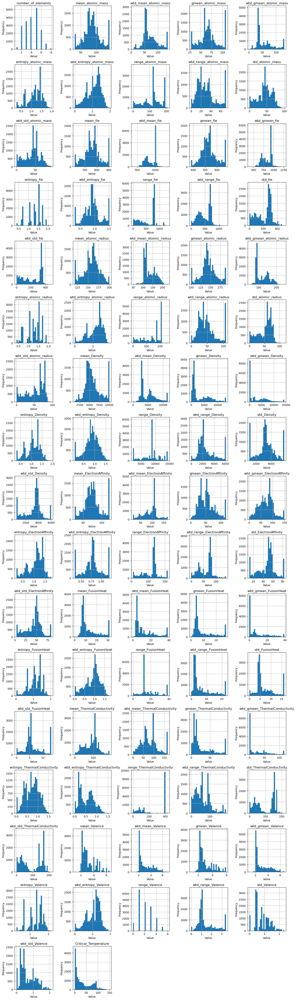

In [59]:
# Plot histograms before transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

In [60]:
# Apply Yeo - Johnson transformation (works for both positive and negative values)

pt = PowerTransformer(method='yeo-johnson')
df2[numerical_features] = pt.fit_transform(df2[numerical_features])

print(df2[numerical_features].skew())

number_of_elements      -0.071109
mean_atomic_mass         0.009359
wtd_mean_atomic_mass     0.043425
gmean_atomic_mass       -0.018427
wtd_gmean_atomic_mass   -0.000235
                           ...   
range_Valence           -0.033327
wtd_range_Valence       -0.010699
std_Valence             -0.010112
wtd_std_Valence          0.026710
Critical_Temperature    -0.081702
Length: 82, dtype: float64


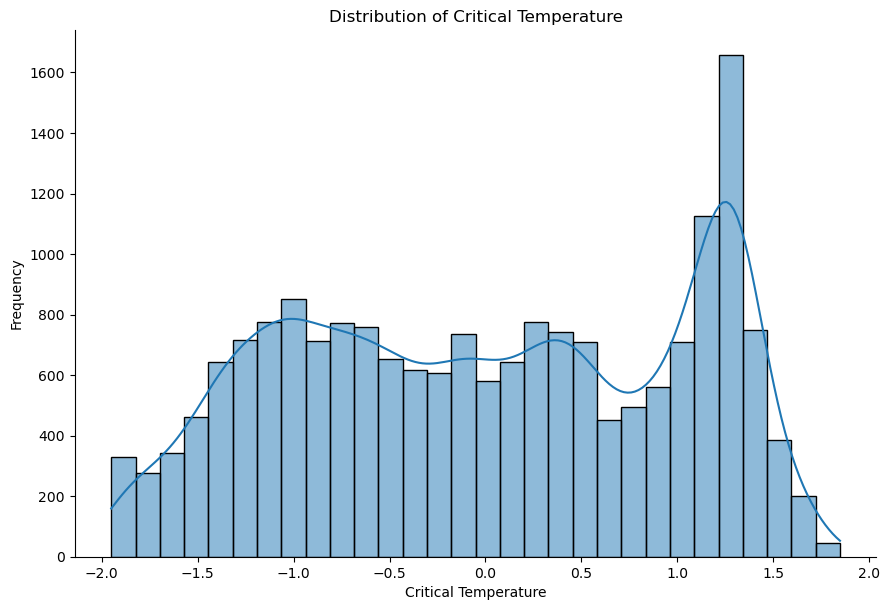

In [63]:
# distribution plot after transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution
plt.title('Distribution of Critical Temperature')
plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.show()

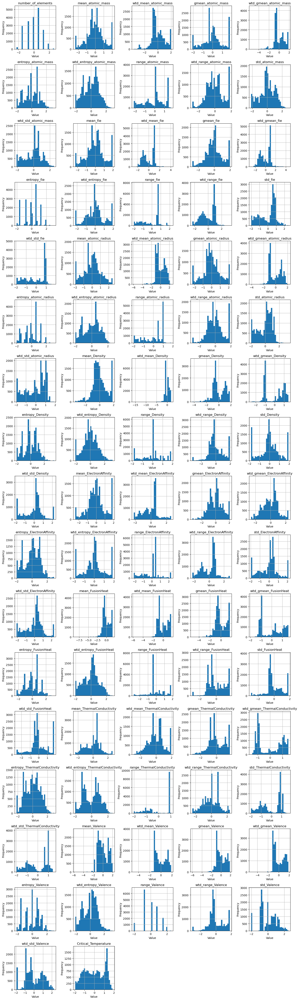

In [65]:
# Plot histograms after transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

## 6. **Exploratory Data Analysis (EDA):**

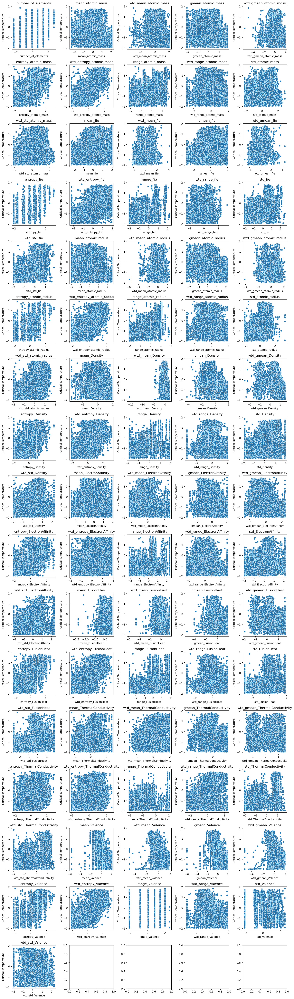

In [67]:
# generates scatter plots for each numerical feature

# List of numerical features (excluding 'Demand')
num_cols = [col for col in df2.columns if col != 'Critical_Temperature']

# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.scatterplot(data=df1, x=col, y='Critical_Temperature')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Critical Temperature')

# Adjust layout
plt.tight_layout()

# Save the plot as an image
plt.savefig("Scatter.png")

# Display the plot
plt.show()

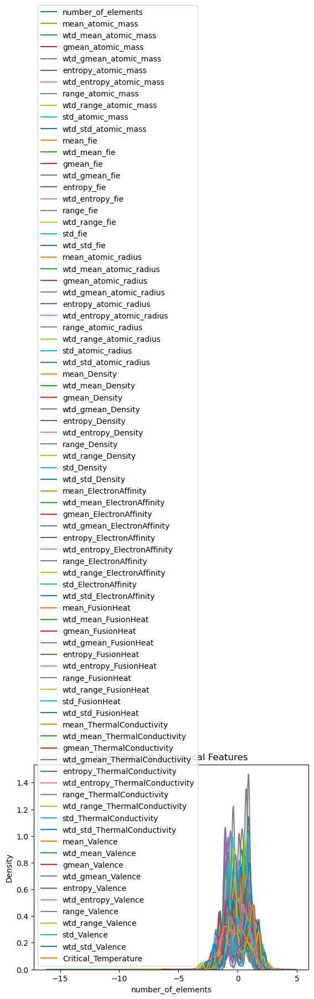

In [69]:
# to generate a Kernel Density Estimate (KDE) plot 

for column in df2.select_dtypes(include=['float64', 'int64']).columns:
    sns.kdeplot(df2[column], label=column)

plt.legend()
plt.title('KDE Plots for Numerical Features')
plt.show()

<Axes: xlabel='Critical_Temperature', ylabel='Density'>

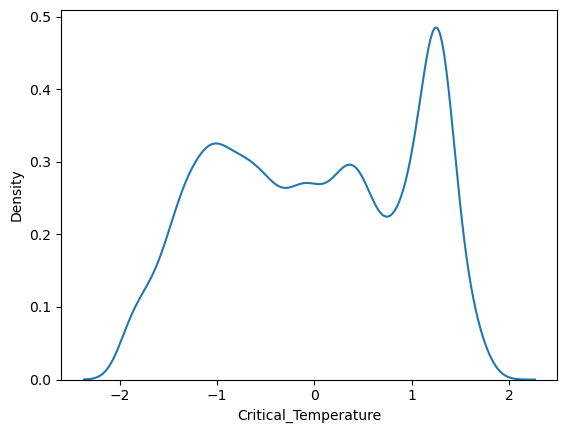

In [71]:
# to generate a Kernel Density Estimate (KDE) plot for target variable

sns.kdeplot(df2['Critical_Temperature'])

In [73]:
# calculates the correlation matrix for the numerical columns

corr1 = df2[numeric_columns].corr()

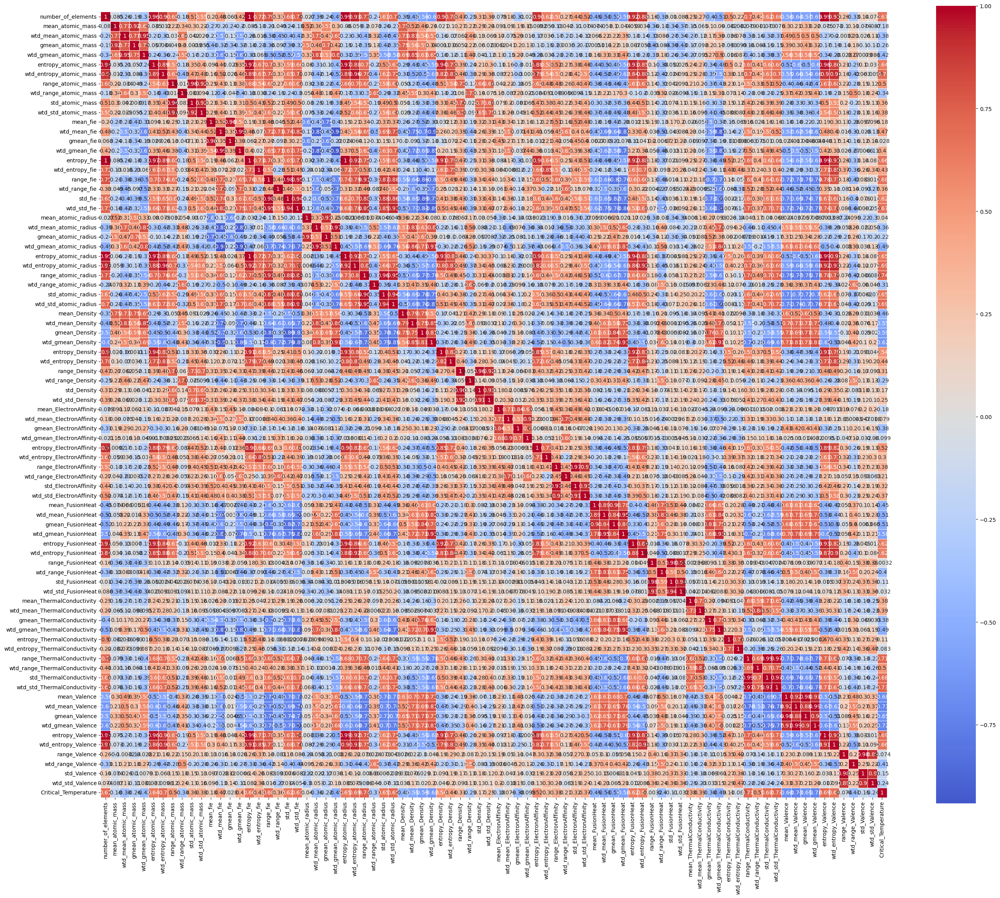

In [75]:
# Create the heatmap with annotations
plt.figure(figsize=(28,28))
sns.heatmap(corr1, annot=True, cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.75}, square=True)

# Rotate x-axis and y-axis labels to make them readable
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Save the heatmap as an image
plt.savefig("corr.png")

# Show the plot
plt.tight_layout()  # To avoid overlap

# Display the heatmap
plt.show()

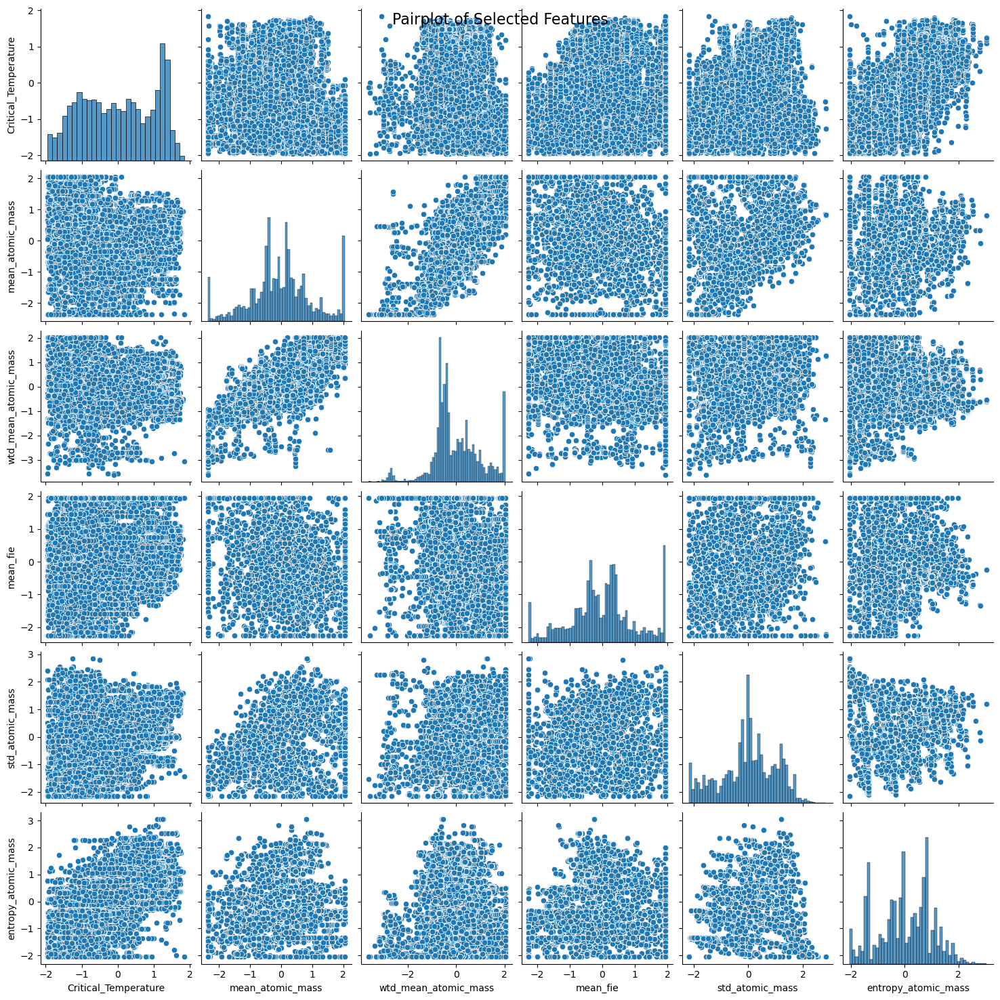

In [77]:
# Pairplot

subset = df2[['Critical_Temperature', 'mean_atomic_mass', 'wtd_mean_atomic_mass', 'mean_fie', 'std_atomic_mass', 'entropy_atomic_mass']]  
sns.pairplot(subset)
plt.suptitle("Pairplot of Selected Features", size=16)
plt.show()


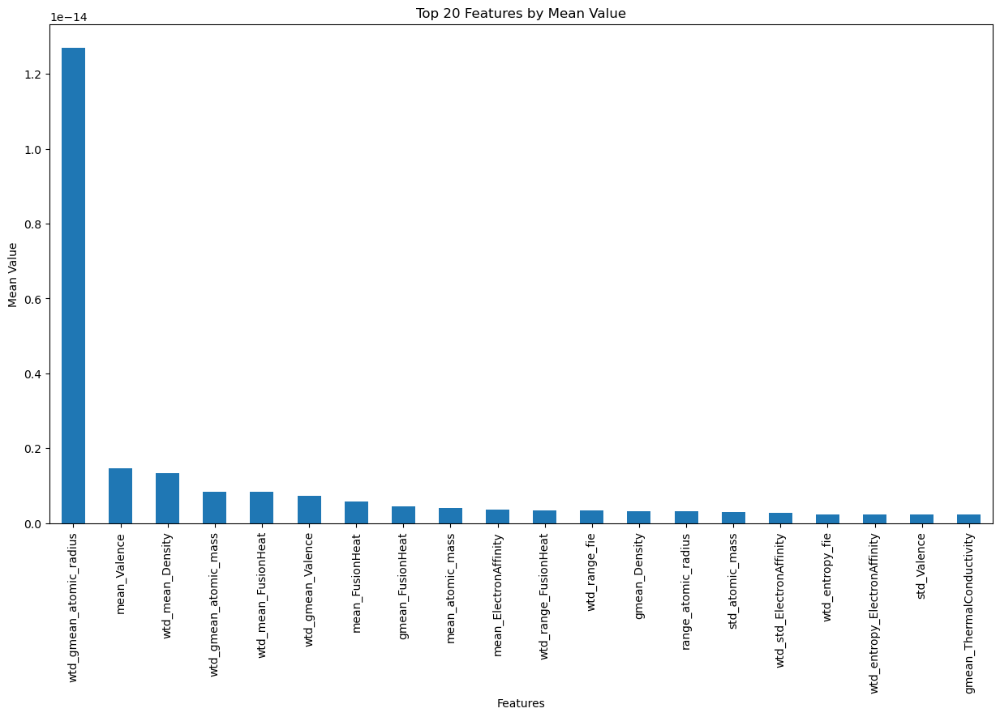

In [79]:
# Example: Bar plot for the mean of each feature

mean_values = df2.mean()
mean_values.sort_values(ascending=False).head(20).plot(kind='bar', figsize=(15, 8))
plt.title("Top 20 Features by Mean Value")
plt.xlabel("Features")
plt.ylabel("Mean Value")
plt.show()

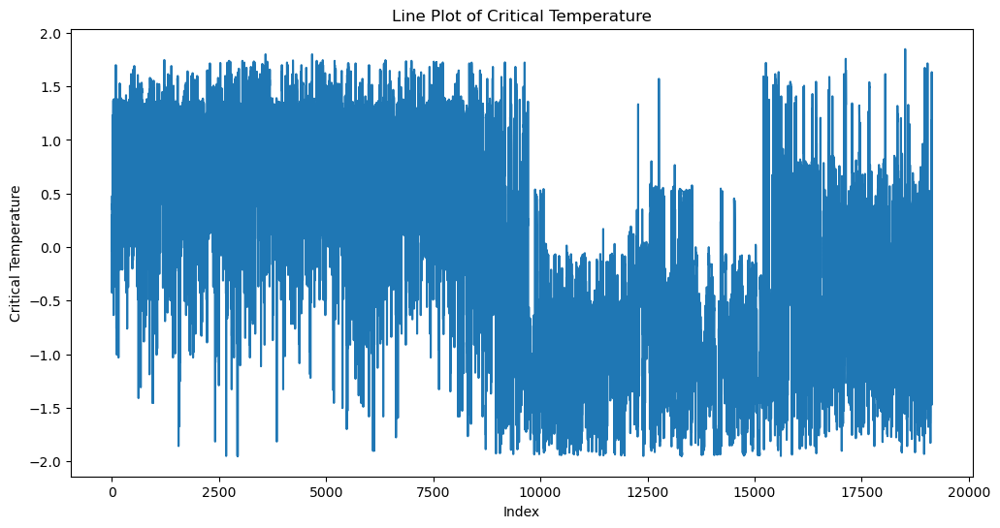

In [81]:
# Example: Line plot of 'critical_temp' over the index (if temporal data exists)

plt.figure(figsize=(12, 6))
sns.lineplot(data=df2['Critical_Temperature'])
plt.title('Line Plot of Critical Temperature')
plt.xlabel('Index')
plt.ylabel('Critical Temperature')
plt.show()


## 7. **Feature Engineering:**

In [83]:
# Identify categorical features

categorical_columns = df2.select_dtypes(include=['object', 'category']).columns
print("Categorical Columns:", categorical_columns)

Categorical Columns: Index([], dtype='object')


## 8. **Feature Selection:**

**Setting Target Value**

In [85]:
# Feature matrix (excluding the target column)
x = df2.drop(columns=['Critical_Temperature'])
y = df2['Critical_Temperature']

In [87]:
x

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
0,-0.064766,0.127924,-0.388276,-0.018420,-0.591590,-0.094263,-0.126873,0.132255,0.226201,0.368104,...,-1.068221,-0.752613,-0.927645,-0.703987,0.057462,-0.102133,-0.807674,-0.250103,-0.821177,-0.407594
1,0.621841,0.272362,-0.362178,0.293832,-0.576994,0.790520,-0.139112,0.132255,0.443807,0.120698,...,-1.619725,-0.752613,-1.721521,-0.720687,0.641886,-0.155968,0.090427,-0.184540,-0.347936,-0.321904
2,-0.064766,0.127924,-0.387376,-0.018420,-0.591281,-0.094263,-0.349454,0.132255,0.423464,0.368104,...,-1.068221,-0.728454,-0.927645,-0.680563,0.057462,-0.206463,-0.807674,-0.206181,-0.821177,-0.386613
3,-0.064766,0.127924,-0.387826,-0.018420,-0.591435,-0.094263,-0.231572,0.132255,0.326355,0.368104,...,-1.068221,-0.740499,-0.927645,-0.692259,0.057462,-0.151425,-0.807674,-0.228035,-0.821177,-0.396880
4,-0.064766,0.127924,-0.389177,-0.018420,-0.591898,-0.094263,0.053004,0.132255,0.015564,0.368104,...,-1.068221,-0.777051,-0.927645,-0.727544,0.057462,-0.016211,-0.807674,-0.294899,-0.821177,-0.430426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19132,-0.768944,0.144995,0.717872,-0.144395,0.485494,-1.138752,-0.807106,0.886462,1.240223,1.455710,...,1.360375,1.281187,1.417992,1.320498,-0.708214,-0.065558,0.090427,-1.013299,0.307047,0.723013
19133,0.621841,0.254788,-0.757815,-0.091369,-0.769558,0.354433,1.417074,1.329729,-1.494438,1.252950,...,-1.169858,-1.141295,-1.022679,-1.062872,0.765414,0.742365,-0.807674,-0.549890,-0.904314,-1.100720
19134,-1.495811,0.533423,0.908337,1.422473,1.257394,-1.334975,-1.321558,-1.877074,1.175131,-1.857399,...,1.275604,1.333267,1.369492,1.393603,-1.503432,-1.509007,-0.807674,1.700873,-0.656892,-0.511603
19135,-1.495811,0.533423,0.952812,1.422473,1.285920,-1.334975,-1.107332,-1.877074,0.190943,-1.857399,...,1.275604,1.290531,1.369492,1.352747,-1.503432,-1.273817,-0.807674,1.021639,-0.656892,-0.338310


***Select KBest, f_Regression***

In [89]:
# Apply SelectKBest with the F-test for regression

k_best = SelectKBest(score_func=f_regression, k='all')  # You can adjust 'k' to select specific features
x_new = k_best.fit_transform(x, y)

In [91]:
# Get the scores for each feature

scores = k_best.scores_

In [93]:
# Create a DataFrame with feature names and their corresponding scores

feature_scores = pd.DataFrame({"Feature": x.columns, "Score": scores})
feature_scores = feature_scores.sort_values(by="Score", ascending=False)

In [95]:
# Display the top features

print(feature_scores.head(20))

                        Feature         Score
27          range_atomic_radius  22972.783587
70  wtd_std_ThermalConductivity  21643.284075
72             wtd_mean_Valence  21509.234994
74            wtd_gmean_Valence  20122.383641
67    range_ThermalConductivity  19957.025425
6       wtd_entropy_atomic_mass  18179.762580
75              entropy_Valence  17645.155233
30        wtd_std_atomic_radius  17592.204927
26    wtd_entropy_atomic_radius  17422.836113
71                 mean_Valence  16734.359454
69      std_ThermalConductivity  16573.149604
17                    range_fie  16472.755427
0            number_of_elements  15831.663479
20                  wtd_std_fie  15196.849990
76          wtd_entropy_Valence  14905.988690
15                  entropy_fie  14770.614350
73                gmean_Valence  14320.570241
29            std_atomic_radius  13933.458645
25        entropy_atomic_radius  13805.871092
5           entropy_atomic_mass  12927.737755


***Removing redundant or irrelevant features***

In [97]:
# Calculate the correlation matrix
corr_matrix = df2.corr()

# Set a correlation threshold (e.g., 0.95 for high correlation)
threshold = 0.95

# Get the indices of the upper triangle of the correlation matrix (since it's symmetrical)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than the threshold
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print("Redundant features to drop:", to_drop)


Redundant features to drop: ['entropy_atomic_mass', 'std_atomic_mass', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'std_fie', 'wtd_gmean_atomic_radius', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius', 'std_Density', 'std_ElectronAffinity', 'std_FusionHeat', 'std_ThermalConductivity', 'wtd_std_ThermalConductivity', 'gmean_Valence', 'wtd_gmean_Valence', 'entropy_Valence', 'std_Valence']


In [99]:
# Drop the redundant features

df3 = df2.drop(columns=to_drop)

In [101]:
df3.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence,Critical_Temperature
0,-0.064766,0.127924,-0.388276,-0.018420,-0.591590,-0.126873,0.132255,0.226201,0.607815,0.178080,...,-0.855842,0.907595,0.067781,-1.068221,-0.752613,-0.102133,-0.807674,-0.250103,-0.407594,0.297329
1,0.621841,0.272362,-0.362178,0.293832,-0.576994,-0.139112,0.132255,0.443807,0.625721,0.049866,...,0.190566,1.049812,-0.075374,-1.619725,-0.752613,-0.155968,0.090427,-0.184540,-0.321904,0.208726
2,-0.064766,0.127924,-0.387376,-0.018420,-0.591281,-0.349454,0.132255,0.423464,0.609506,0.178080,...,-0.903584,0.907595,0.067781,-1.068221,-0.728454,-0.206463,-0.807674,-0.206181,-0.386613,-0.035956
3,-0.064766,0.127924,-0.387826,-0.018420,-0.591435,-0.231572,0.132255,0.326355,0.608661,0.178080,...,-0.878178,0.907595,0.067781,-1.068221,-0.740499,-0.151425,-0.807674,-0.228035,-0.396880,0.076598
4,-0.064766,0.127924,-0.389177,-0.018420,-0.591898,0.053004,0.132255,0.015564,0.606123,0.178080,...,-0.817704,0.907595,0.067781,-1.068221,-0.777051,-0.016211,-0.807674,-0.294899,-0.430426,0.111354


In [103]:
df3.shape

(19088, 62)

In [105]:
df3.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'wtd_entropy_atomic_mass',
       'range_atomic_mass', 'wtd_range_atomic_mass', 'wtd_std_atomic_mass',
       'mean_fie', 'wtd_mean_fie', 'wtd_entropy_fie', 'range_fie',
       'wtd_range_fie', 'wtd_std_fie', 'mean_atomic_radius',
       'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'mean_Density', 'wtd_mean_Density',
       'gmean_Density', 'wtd_gmean_Density', 'entropy_Density',
       'wtd_entropy_Density', 'range_Density', 'wtd_range_Density',
       'wtd_std_Density', 'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
       'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity',
       'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
       'wtd_std_ElectronAffinity', 'mean_FusionHeat', 'wtd_mean_FusionHeat',
       'gmea

## 9. **Split Data into Training and Testing Sets:**

In [107]:
# Feature matrix and target variable

X = df3.drop(columns=['Critical_Temperature'])  # Features (independent variables)
Y = df3['Critical_Temperature']  # Target (dependent variable)

# Step 1: Split into train + temp (70%) and unseen (10%)
X_train, X_temp, Y_train, y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)  # 0.3 = test + unseen

# Step 2: Split temp into test (20%) and unseen (10%)
X_test, X_unseen, Y_test, y_unseen = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)  # 1/3 of 30% = 10%

In [110]:
# Split the data into training (80%) and testing (20%) sets

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Split the data into training (80%) and testing (20%) sets

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [112]:
# Print the shape of the training and testing sets
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
#print("Unseen features shape:", X_unseen.shape)
print("Training target shape:", y_train.shape)
print("Testing target shape:", y_test.shape)
#print("Unseen target shape:", y_unseen.shape)


Training features shape: (15270, 61)
Testing features shape: (3818, 61)
Training target shape: (15270,)
Testing target shape: (3818,)


## 10. **Feature Scaling:**

In [115]:
# Instantiate the StandardScaler

scaler = StandardScaler()

In [117]:
# Fit and transform the training data, and transform the test data

X_train_scaled = scaler.fit_transform(X_train)  # Fit and scale training data
X_test_scaled = scaler.transform(X_test)  # Use the fitted scaler to scale test data

In [119]:
# the list of selected features, make sure it matches the number of features in X_train_scaled

selected_features = X_train.columns.tolist()  # This will give the correct column names

In [121]:
# to check the transformed data

X_standardized = pd.DataFrame(X_train_scaled, columns=selected_features)
X_standardized

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence
0,-0.064806,-0.357656,0.470090,-0.348467,0.624650,-0.004364,0.097566,0.485957,-0.048276,0.433975,...,-1.197370,-1.092507,0.904915,2.122708,-1.065206,-0.953473,0.651540,-0.802507,-1.222391,-0.652778
1,-0.769814,0.984524,0.050622,0.873225,0.257367,-0.304406,1.079388,-0.167900,0.314502,0.513529,...,-0.678185,-1.173057,-0.564129,0.027975,1.649939,1.661418,-0.706457,0.090611,1.541829,-0.237859
2,-0.064806,0.379893,-0.414777,0.123687,-0.560212,0.655642,0.601448,-1.004188,0.568493,0.287840,...,-1.217276,-1.101057,0.904915,0.826561,-1.065206,-1.079998,0.304051,-0.802507,-0.652954,-0.913723
3,-0.064806,2.058015,1.907194,1.776832,1.858294,-0.164302,-0.431390,1.541551,-0.817861,-0.746127,...,1.185320,0.409523,-1.020444,-0.855050,1.140695,1.405341,-0.548809,0.816591,1.564479,0.851728
4,-0.064806,-0.357656,-0.634261,-0.348467,-0.627191,0.512846,0.097566,-0.843314,0.136776,0.433975,...,-1.197370,-1.087880,0.904915,0.854304,-1.065206,-1.077629,0.329357,-0.802507,-0.686497,-0.907527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15265,-1.497540,2.061683,2.035984,1.776832,1.858378,-1.089909,-0.607199,0.691077,-0.009649,-0.340777,...,-0.167954,0.523650,-1.285807,-0.871159,1.867588,1.693180,-1.035993,-2.034766,-3.052811,-1.934921
15266,-0.769814,1.419141,1.703547,0.291877,0.752086,-0.738856,0.966377,1.306800,1.873579,0.616010,...,0.438573,1.054693,-0.720438,-0.415508,1.189264,1.138945,-0.024346,-0.802507,-1.846126,-0.310055
15267,0.622612,0.146810,-0.568182,0.183243,-0.612077,0.933104,0.162956,-0.604204,0.269492,-0.333167,...,-0.836447,-1.081478,0.904915,0.832058,-0.451108,-1.004665,0.644464,0.090611,-0.454350,-0.439914
15268,-0.064806,-0.357656,-0.657792,-0.348467,-0.650312,0.520119,0.097566,-0.860695,0.130676,0.433975,...,-1.197370,-1.087732,0.904915,0.826561,-1.065206,-1.079998,0.304051,-0.802507,-0.652954,-0.913723


## 11. **Build the ML Model:** (at least 5)

In [123]:
# Define models
models = {
    "Linear Regression": LinearRegression(),
    "Lasso Regression": Lasso(alpha=0.01),  # Default alpha=1. Adjust as needed.
    "Ridge Regression": Ridge(alpha=0.1),   # Default alpha=1. Adjust as needed.
    "Support Vector Regressor": SVR(kernel='rbf'),
    "Random Forest Regressor": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting Regressor": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "AdaBoost Regressor": AdaBoostRegressor(n_estimators=50, random_state=42),
    "MLP Regressor": MLPRegressor(hidden_layer_sizes=(50, 50), max_iter=500, random_state=42),
    "Decision Tree Regressor": DecisionTreeRegressor(random_state=42),
}


## 12. **Model Evaluation:**

In [125]:
# Store results
results = {}

# Train and evaluate each model
for name, model in models.items():
    print(f"Training and evaluating model: {name}")
    # Train the model
    model.fit(X_train_scaled, y_train)
    
    # Predict on test data
    y_pred = model.predict(X_test_scaled)
    
    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    
    # Store results
    results[name] = {"MSE": mse, "RMSE": rmse, "R2": r2, "MAE": mae}


Training and evaluating model: Linear Regression
Training and evaluating model: Lasso Regression
Training and evaluating model: Ridge Regression
Training and evaluating model: Support Vector Regressor
Training and evaluating model: Random Forest Regressor
Training and evaluating model: Gradient Boosting Regressor
Training and evaluating model: AdaBoost Regressor
Training and evaluating model: MLP Regressor
Training and evaluating model: Decision Tree Regressor


In [127]:
# Convert results to a DataFrame for better visualization

results_df = pd.DataFrame(results).T
results_df

,MSE,RMSE,R2,MAE
Linear Regression,0.258782,0.508707,0.742424,0.401258
Lasso Regression,0.286214,0.534989,0.715120,0.428653
Ridge Regression,0.258778,0.508702,0.742428,0.401258
Support Vector Regressor,0.126314,0.355407,0.874275,0.231750
Random Forest Regressor,0.074205,0.272406,0.926141,0.170877
Gradient Boosting Regressor,0.148383,0.385206,0.852308,0.287869
AdaBoost Regressor,0.328672,0.573299,0.672860,0.490047
MLP Regressor,0.106954,0.327039,0.893544,0.221572
Decision Tree Regressor,0.116835,0.341811,0.883710,0.199070


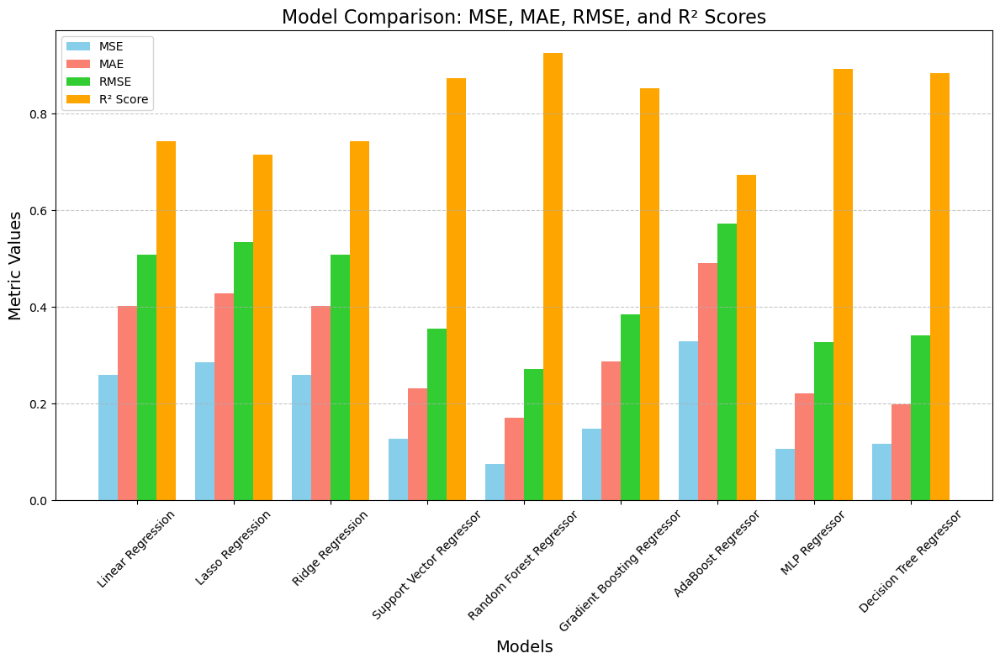

In [129]:
# Extract metrics
model_names = list(results.keys())
mse_values = [results[model]["MSE"] for model in model_names]
mae_values = [results[model]["MAE"] for model in model_names]
rmse_values = [results[model]["RMSE"] for model in model_names]
r2_values = [results[model]["R2"] for model in model_names]

# Create a figure for comparison
x = np.arange(len(model_names))  # Model indices
width = 0.2  # Bar width

plt.figure(figsize=(12, 8))

# Plot MSE
plt.bar(x - 1.5 * width, mse_values, width, label="MSE", color='skyblue')

# Plot MAE
plt.bar(x - 0.5 * width, mae_values, width, label="MAE", color='salmon')

# Plot RMSE
plt.bar(x + 0.5 * width, rmse_values, width, label="RMSE", color='limegreen')

# Plot R² Scores
plt.bar(x + 1.5 * width, r2_values, width, label="R² Score", color='orange')

# Add labels and legend
plt.xlabel("Models", fontsize=14)
plt.ylabel("Metric Values", fontsize=14)
plt.title("Model Comparison: MSE, MAE, RMSE, and R² Scores", fontsize=16)
plt.xticks(x, model_names, rotation=45)
plt.legend(loc="upper left")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


In [131]:
# Find the best model based on R2 Score
best_model = None
best_r2_score = -np.inf
best_model_name = ""

for name, metrics in results.items():
    if metrics["R2"] > best_r2_score:
        best_r2_score = metrics["R2"]
        best_model_name = name
        best_model = models[name]

# Display the best model and its metrics
print(f"Best Model: {best_model_name}")
print(f"R2 Score: {best_r2_score}")
print(f"Metrics: {results[best_model_name]}")


Best Model: Random Forest Regressor
R2 Score: 0.9261410512982974
Metrics: {'MSE': 0.07420481798991824, 'RMSE': 0.2724056129926809, 'R2': 0.9261410512982974, 'MAE': 0.17087730645051283}


## 13. **Hyperparameter Tuning:**

In [133]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

In [135]:
# Initialize the model
rf = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',  # Metric to optimize
    n_jobs=-1,  # Use all processors
    verbose=2  # Increase verbosity for progress updates
)


In [139]:
# Fit GridSearchCV to the training data

grid_search.fit(X_train, y_train)

# Get the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score (Negative MSE):", grid_search.best_score_)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best Score (Negative MSE): -0.07472737677173905


In [141]:
# Retrieve the best model
best_rf = grid_search.best_estimator_

# Predict on the test set
Y_pred = best_rf.predict(X_test)

mse = mean_squared_error(y_test, Y_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, Y_pred)
r2 = r2_score(y_test, Y_pred)

print(f"Test MSE: {mse}")
print(f"Test RMSE: {rmse}")
print(f"Test MAE: {mae}")
print(f"Test R²: {r2}")


Test MSE: 0.07433180253266727
Test RMSE: 0.2726385932561039
Test MAE: 0.1711352946235174
Test R²: 0.9260146586315828


## 14. **Save the Model:**

In [143]:
print("\nSaving Model...")

# Save the best model
joblib.dump(best_rf, 'Critical_Temperature_Prediction_Model.joblib')
print("Model saved as 'Critical_Temperature_Prediction_Model.joblib")



Saving Model...
Model saved as 'Critical_Temperature_Prediction_Model.joblib


In [145]:
# Loading the model

load_model = joblib.load("Critical_Temperature_Prediction_Model.joblib")

## 15. **Test with Unseen Data:**

In [147]:
# load the unseen data

SC_unseen = pd.read_csv("SC_unseen.csv")

In [149]:
SC_unseen.shape

(2126, 82)

In [151]:
# Show a preview of the generated unseen data

SC_unseen.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,2,82.768190,87.837285,82.144935,87.360109,0.685627,0.509575,20.27638,51.522285,10.138190,...,4.750000,4.472136,4.728708,0.686962,0.514653,1,2.750000,0.500000,0.433013,6.4
1,4,76.444563,81.456750,59.356672,68.229617,1.199541,1.108189,121.32760,36.950657,43.823354,...,2.142857,2.213364,2.119268,1.368922,1.309526,1,0.571429,0.433013,0.349927,91.2
2,5,88.936744,51.090431,70.358975,34.783991,1.445824,1.525092,122.90607,10.438667,46.482335,...,2.114679,2.352158,2.095193,1.589027,1.314189,1,0.967890,0.489898,0.318634,38.0
3,4,76.517718,56.149432,59.310096,35.562124,1.197273,1.042132,122.90607,31.920690,44.289459,...,2.251429,2.213364,2.214646,1.368922,1.078855,1,1.074286,0.433013,0.433834,19.0
4,3,104.608490,89.558979,101.719818,88.481210,1.070258,0.944284,59.94547,33.541423,25.225148,...,5.811245,4.762203,5.743954,1.054920,0.803990,3,3.024096,1.414214,0.728448,11.0


In [153]:
# the shape of unseen data

SC_unseen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               2126 non-null   int64  
 1   mean_atomic_mass                 2126 non-null   float64
 2   wtd_mean_atomic_mass             2126 non-null   float64
 3   gmean_atomic_mass                2126 non-null   float64
 4   wtd_gmean_atomic_mass            2126 non-null   float64
 5   entropy_atomic_mass              2126 non-null   float64
 6   wtd_entropy_atomic_mass          2126 non-null   float64
 7   range_atomic_mass                2126 non-null   float64
 8   wtd_range_atomic_mass            2126 non-null   float64
 9   std_atomic_mass                  2126 non-null   float64
 10  wtd_std_atomic_mass              2126 non-null   float64
 11  mean_fie                         2126 non-null   float64
 12  wtd_mean_fie        

In [155]:
# creating pipeline

pipeline = Pipeline(steps =[
    ('Imputer', SimpleImputer(strategy='mean')),
    ('Scalar', StandardScaler()),
    ('Model', load_model)
])

In [157]:
# train the pipeline

pipeline.fit(X_train, y_train)

Pipeline(steps=[('Imputer', SimpleImputer()), ('Scalar', StandardScaler()),
                ('Model',
                 RandomForestRegressor(max_depth=30, max_features='sqrt',
                                       n_estimators=300, random_state=42))])

In [159]:
# saving the pipeline

joblib.dump(pipeline, 'SC_Pipeline.joblib')
print("Pipeline saved as 'SC_Pipeline.joblib")

Pipeline saved as 'SC_Pipeline.joblib


In [161]:
# load the pipeline

load_pipeline =  joblib.load("SC_Pipeline.joblib")

In [163]:
load_pipeline

Pipeline(steps=[('Imputer', SimpleImputer()), ('Scalar', StandardScaler()),
                ('Model',
                 RandomForestRegressor(max_depth=30, max_features='sqrt',
                                       n_estimators=300, random_state=42))])

In [165]:
# Predict on test data

y_pred1 = pipeline.predict(X_test)

In [167]:
y_pred1

array([-1.1527356 ,  0.43204884,  0.0337391 , ...,  1.47956387,
       -0.69026327,  1.5964978 ])

In [169]:
# loading the unseen data

unseen = pd.read_csv('SC_unseen.csv')
unseen.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,2,82.768190,87.837285,82.144935,87.360109,0.685627,0.509575,20.27638,51.522285,10.138190,...,4.750000,4.472136,4.728708,0.686962,0.514653,1,2.750000,0.500000,0.433013,6.4
1,4,76.444563,81.456750,59.356672,68.229617,1.199541,1.108189,121.32760,36.950657,43.823354,...,2.142857,2.213364,2.119268,1.368922,1.309526,1,0.571429,0.433013,0.349927,91.2
2,5,88.936744,51.090431,70.358975,34.783991,1.445824,1.525092,122.90607,10.438667,46.482335,...,2.114679,2.352158,2.095193,1.589027,1.314189,1,0.967890,0.489898,0.318634,38.0
3,4,76.517718,56.149432,59.310096,35.562124,1.197273,1.042132,122.90607,31.920690,44.289459,...,2.251429,2.213364,2.214646,1.368922,1.078855,1,1.074286,0.433013,0.433834,19.0
4,3,104.608490,89.558979,101.719818,88.481210,1.070258,0.944284,59.94547,33.541423,25.225148,...,5.811245,4.762203,5.743954,1.054920,0.803990,3,3.024096,1.414214,0.728448,11.0


In [189]:
unseen = unseen[X_train.columns]


In [177]:
predictions1 = pipeline.predict(unseen)

In [191]:
unseen['Predicted_Crit_Temp'] = predictions1

In [193]:
unseen.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'wtd_entropy_atomic_mass',
       'range_atomic_mass', 'wtd_range_atomic_mass', 'wtd_std_atomic_mass',
       'mean_fie', 'wtd_mean_fie', 'wtd_entropy_fie', 'range_fie',
       'wtd_range_fie', 'wtd_std_fie', 'mean_atomic_radius',
       'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'mean_Density', 'wtd_mean_Density',
       'gmean_Density', 'wtd_gmean_Density', 'entropy_Density',
       'wtd_entropy_Density', 'range_Density', 'wtd_range_Density',
       'wtd_std_Density', 'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
       'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity',
       'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
       'wtd_std_ElectronAffinity', 'mean_FusionHeat', 'wtd_mean_FusionHeat',
       'gmea

In [195]:
print("Predicted Citical Temperature for the 1st given data:", predictions1[0])

Predicted Citical Temperature for the 1st given data: -0.385738316629097


In [199]:
unseen.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence,Predicted_Crit_Temp
0,2,82.768190,87.837285,82.144935,87.360109,0.509575,20.27638,51.522285,8.779930,711.80,...,0.583527,6.00000,25.500000,4.50,4.750000,0.514653,1,2.750000,0.433013,-0.385738
1,4,76.444563,81.456750,59.356672,68.229617,1.108189,121.32760,36.950657,40.612293,794.00,...,0.201966,399.97342,171.424774,2.25,2.142857,1.309526,1,0.571429,0.349927,-0.314717
2,5,88.936744,51.090431,70.358975,34.783991,1.525092,122.90607,10.438667,44.261233,743.42,...,0.209583,399.97342,91.728732,2.40,2.114679,1.314189,1,0.967890,0.318634,-0.328690
3,4,76.517718,56.149432,59.310096,35.562124,1.042132,122.90607,31.920690,51.815571,787.05,...,0.304547,399.97342,57.127669,2.25,2.251429,1.078855,1,1.074286,0.433834,-0.354544
4,3,104.608490,89.558979,101.719818,88.481210,0.944284,59.94547,33.541423,15.159829,722.10,...,0.106068,138.48000,55.544846,5.00,5.811245,0.803990,3,3.024096,0.728448,-0.357442


In [201]:
SC_unseen.to_csv('SC_unseen_Result.csv',index=False)